In [1]:
import sys
sys.path.append("..")

from pathlib import Path
import numpy as np
import pandas as pd
import geopandas as gpd
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from ETL.common import execute_query
from fitter import Fitter
import scipy.stats as stats
from sdv.evaluation.single_table import run_diagnostic, evaluate_quality
from sdv.metadata import Metadata
from sdv.single_table import CTGANSynthesizer
from sklearn.cluster import DBSCAN
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KernelDensity

C:\Users\jcf\AppData\Roaming\Python\Python311\site-packages\matplotlib\projections\__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


In [2]:
force_generate_model = True

In [3]:
q = "SELECT * FROM houses_clean ORDER BY timestamp DESC"
df_raw = execute_query(q)

In [4]:
df = df_raw.copy()

In [5]:
loudness_df = gpd.read_file("2017_isofones_total_lden_mapa_estrategic_soroll_bcn.gpkg",
                     layer="2017_Isofones_Total_Lden_Mapa_Estrategic_Soroll_BCN")
loudness_df = loudness_df.to_crs(epsg=4326)

In [6]:
df = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326")
df = df.sjoin(loudness_df, how="left")
df = df[df.columns.difference(["fid", "index_right"])]
df = df.rename(columns={"Rang": "loudness"})

In [7]:
cat_cols = ["active", "city", "type", "orientation", "age", "parking", "floor", 
            "elevator", "furniture", "state", "heating", "water_heating", 
            "formatted_address", "pets", "loudness"]
num_cols = ["price", "rooms", "bathrooms", "surface", "energy", "emissions", "latitude", "longitude"]

plot_cols = cat_cols + num_cols

for c in cat_cols:
    df[c] = df[c].fillna("Null")
    if c == "age":
        df[c] = pd.Categorical(df[c], ["Null", "Menos de 1 año", "1 a 5 años", "5 a 10 años", "10 a 20 años", 
                                       "20 a 30 años", "30 a 50 años", "70 a 100 años", "+ 100 años"])
    elif c == "floor":
        df[c] = pd.Categorical(df[c], ["Null", "Sótano", "Otro", "Bajos", "Entresuelo", "1ª planta", "2ª planta",
                                       "3ª planta", "4ª planta", "5ª planta", "6ª planta", "7ª planta", 
                                       "8ª planta", "9ª planta", "10ª planta",  "11ª planta", "12ª planta",
                                       "13ª planta", "14ª planta", "A partir de la 15ª planta"])
    elif c == "orientation":
        df[c] = pd.Categorical(df[c], ["Null", "Este", "Noreste", "Norte", "Noroeste", "Oeste", "Suroeste", "Sur", "Sureste"])
    else:
        df[c] = pd.Categorical(df[c])

group_cols = [e for e in cat_cols if e not in ("active", "formatted_address")]

In [8]:
original_data = df.copy()[group_cols+num_cols]

for c in cat_cols:
    if c in original_data.columns:
        original_data[c] = original_data[c].astype(object)

try:
    if force_generate_model:
        raise FileNotFoundError
    metadata = Metadata.load_from_json("metadata_ctgan.json")
except FileNotFoundError:
    metadata = Metadata.detect_from_dataframe(
        data=original_data,
        table_name='houses')
    metadata_json = Path("metadata_ctgan.json")
    metadata_json.unlink()
    metadata.save_to_json("metadata_ctgan.json")

try:
    if force_generate_model:
        raise FileNotFoundError
    synthesizer = CTGANSynthesizer.load("CTGANSynthesizer.pkl")
except FileNotFoundError:
    synthesizer = CTGANSynthesizer(metadata, locales=["es_ES"])
    synthesizer.fit(original_data)
    model_file = Path("CTGANSynthesizer.pkl")
    model_file.unlink()
    synthesizer.save("CTGANSynthesizer.pkl")

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\rdt\transformers\pii\anonymizer.py:102: UserWarning: Locales ['es_ES'] do not support provider 'geo' and function 'latitude'.
In place of these locales, 'en_US' will be used instead. Please refer to the localized provider docs for more information: https://faker.readthedocs.io/en/master/locales.html
  warnings.warn(
C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\rdt\transformers\pii\anonymizer.py:102: UserWarning: Locales ['es_ES'] do not support provider 'geo' and function 'longitude'.
In place of these locales, 'en_US' will be used instead. Please refer to the localized provider docs for more information: https://faker.readthedocs.io/en/master/locales.html
  warnings.warn(


In [9]:
synthetic_data = synthesizer.sample(num_rows=original_data.shape[0])
synthetic_data["pets"] = synthetic_data["pets"].astype(str).str.lower()
synthetic_data["pets"] = synthetic_data["pets"].str.replace("null", "Null")

In [10]:
diagnostic = run_diagnostic(df[group_cols+num_cols], synthetic_data, metadata)
quality_report = evaluate_quality(df[group_cols+num_cols], synthetic_data, metadata)

Generating report ...

(1/2) Evaluating Data Validity: |███████████████████████████████████████████████████| 21/21 [00:00<00:00, 1110.04it/s]|
Data Validity Score: 98.8%

(2/2) Evaluating Data Structure: |█████████████████████████████████████████████████████| 1/1 [00:00<00:00, 331.72it/s]|
Data Structure Score: 23.53%

Overall Score (Average): 61.17%

Generating report ...

(1/2) Evaluating Column Shapes: |████████████████████████████████████████████████████| 21/21 [00:00<00:00, 343.39it/s]|
Column Shapes Score: 88.31%

(2/2) Evaluating Column Pair Trends: |██████▊                                       | 31/210 [00:00<00:00, 305.31it/s]|

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  contingency_real = real.groupby(list(columns), dropna=False).size() / len(real)
C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  contingency_real = real.groupby(list(columns), dropna=False).size() / len(real)
C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pair

(2/2) Evaluating Column Pair Trends: |█████████████▌                                | 62/210 [00:00<00:00, 213.47it/s]|

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  contingency_real = real.groupby(list(columns), dropna=False).size() / len(real)
C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  contingency_real = real.groupby(list(columns), dropna=False).size() / len(real)
C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pair

(2/2) Evaluating Column Pair Trends: |██████████████████████▌                      | 105/210 [00:00<00:00, 183.62it/s]|

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  contingency_real = real.groupby(list(columns), dropna=False).size() / len(real)
C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  contingency_real = real.groupby(list(columns), dropna=False).size() / len(real)
C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pair

(2/2) Evaluating Column Pair Trends: |█████████████████████████████████▍           | 156/210 [00:00<00:00, 219.93it/s]|

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  contingency_real = real.groupby(list(columns), dropna=False).size() / len(real)
C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning: The values in the array are unorderable. Pass `sort=False` to suppress this warning.
  combined_index = contingency_real.index.union(contingency_synthetic.index)
C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a futu

(2/2) Evaluating Column Pair Trends: |█████████████████████████████████████████████| 210/210 [00:00<00:00, 220.55it/s]|
Column Pair Trends Score: 78.13%

Overall Score (Average): 83.22%



C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  contingency_real = real.groupby(list(columns), dropna=False).size() / len(real)
C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning: The values in the array are unorderable. Pass `sort=False` to suppress this warning.
  combined_index = contingency_real.index.union(contingency_synthetic.index)
C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a futu

In [11]:
synthetic_data.head(5)

,city,type,orientation,age,parking,floor,elevator,furniture,state,heating,...,pets,loudness,price,rooms,bathrooms,surface,energy,emissions,latitude,longitude
0,Girona,Piso,Suroeste,Menos de 1 año,Null,1ª planta,true,true,Barcelona,Gas Natural,...,true,60 - 65 dB(A),818.0,1.0,1.0,132.0,204.60,53.46,-51.906202,-25.742212
1,Valladolid,Casa o chalet,Null,Menos de 1 año,Privado,Null,Null,true,Guadalajara,Gas Natural,...,Null,65 - 70 dB(A),833.0,4.0,3.0,247.0,79.10,40.20,16.697640,-54.335410
2,Madrid,Apartamento,Null,Null,Null,2ª planta,Null,Null,Navarra,Null,...,Null,Null,1321.0,3.0,NaN,70.0,999.00,993.24,-6.427151,-122.913169
3,Vizcaya,Apartamento,Null,Null,Null,Null,Null,true,Albacete,Null,...,Null,70 - 75 dB(A),2440.0,2.0,2.0,33.0,999.00,999.00,-7.428812,133.579027
4,Teruel,Piso,Noreste,+ 100 años,Null,2ª planta,Null,true,Huelva,Electricidad,...,Null,Null,975.0,1.0,1.0,49.0,99.66,36.65,45.766738,-26.507340


In [12]:
for c in group_cols+num_cols:    
    if c not in ("formatted_address", "active", "city"):
        fig = go.Figure()
        fig.add_trace(go.Histogram(x=synthetic_data[c].sort_values(), name=f"Synthetic {c}"))
        fig.add_trace(go.Histogram(x=df[c].sort_values(), name=f"Real {c}"))
        
        fig.update_layout(
            barmode="overlay"
        )
        fig.update_traces(opacity=0.5)
        fig.show()

In [13]:
cols = [c for c in group_cols+num_cols if c not in ("city", "state", "lat", "lng")]

diagnostic = run_diagnostic(df[cols], synthetic_data, metadata)
quality_report = evaluate_quality(df[cols], synthetic_data, metadata)

Generating report ...

(1/2) Evaluating Data Validity: |████████████████████████████████████████████████████| 21/21 [00:00<00:00, 994.60it/s]|
Data Validity Score: 98.8%

(2/2) Evaluating Data Structure: |█████████████████████████████████████████████████████| 1/1 [00:00<00:00, 166.80it/s]|
Data Structure Score: 25.0%

Overall Score (Average): 61.9%

Generating report ...

(1/2) Evaluating Column Shapes: |████████████████████████████████████████████████████| 21/21 [00:00<00:00, 301.58it/s]|
Column Shapes Score: 88.31%

(2/2) Evaluating Column Pair Trends: |███████▍                                      | 34/210 [00:00<00:00, 331.60it/s]|

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:47: RuntimeWarning:

The values in the array are unorderable. Pass `sort=False` to suppress this warning.

C:\Users\jcf\

(2/2) Evaluating Column Pair Trends: |██████████████▉                               | 68/210 [00:00<00:00, 180.00it/s]|

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of panda

(2/2) Evaluating Column Pair Trends: |███████████████████▋                          | 90/210 [00:00<00:00, 167.36it/s]|

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of panda

(2/2) Evaluating Column Pair Trends: |███████████████████████████                  | 126/210 [00:00<00:00, 153.60it/s]|

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of panda

(2/2) Evaluating Column Pair Trends: |██████████████████████████████████████▏      | 178/210 [00:00<00:00, 184.75it/s]|

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\sdmetrics\column_pairs\statistical\contingency_similarity.py:43: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of panda

(2/2) Evaluating Column Pair Trends: |█████████████████████████████████████████████| 210/210 [00:01<00:00, 194.76it/s]|
Column Pair Trends Score: 78.13%

Overall Score (Average): 83.22%



In [14]:
probs = {}

for c in group_cols:    
    df_grouped = df.groupby(c).count().reset_index()[[c, "id"]]
    df_grouped[f"prob_{c}"] = 100 * df_grouped["id"] / df_grouped["id"].sum()
    df_grouped = df_grouped[[c, f"prob_{c}"]]
    probs[c] = df_grouped

probs

C:\Users\jcf\AppData\Local\Temp\ipykernel_33640\434148955.py:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\jcf\AppData\Local\Temp\ipykernel_33640\434148955.py:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\jcf\AppData\Local\Temp\ipykernel_33640\434148955.py:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\jcf\AppData\Local\Temp\ipykernel_33640\434148955.py:4: FutureWarning:

The default of

{'city':                      city  prob_city
 0                  Abrera   0.057848
 1              Aiguafreda   0.038565
 2                  Alella   0.192827
 3           Arenys de Mar   0.347088
 4          Arenys de Munt   0.115696
 ..                    ...        ...
 165   Vilanova del Vallès   0.077131
 166  Vilanova i la Geltrú   0.944852
 167       Vilassar de Mar   0.250675
 168                 Òdena   0.019283
 169                Òrrius   0.019283
 
 [170 rows x 2 columns],
 'type':             type  prob_type
 0    Apartamento  31.141535
 1   Casa adosada   2.082530
 2  Casa o chalet   7.481681
 3         Dúplex   1.793290
 4        Estudio   3.027381
 5  Finca rústica   0.404936
 6           Loft   0.848438
 7           Piso  47.917470
 8    Planta baja   0.964134
 9          Ático   4.338604,
 'orientation':   orientation  prob_orientation
 0        Null         65.561126
 1        Este          4.261473
 2     Noreste          3.355187
 3       Norte          2.815272
 

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
genhyperbolic,9.203673,1275.298749,1308.014029,inf,0.086117,1.484021e-33
norminvgauss,12.182583,1288.081175,1314.253399,inf,0.094249,4.055392e-40
johnsonsu,12.720043,843.304389,869.476612,inf,0.049644,1.982889e-11
cauchy,12.749595,799.172818,812.258930,inf,0.118289,5.172924e-63
skewcauchy,13.032745,898.095505,917.724672,inf,0.083665,1.079201e-31


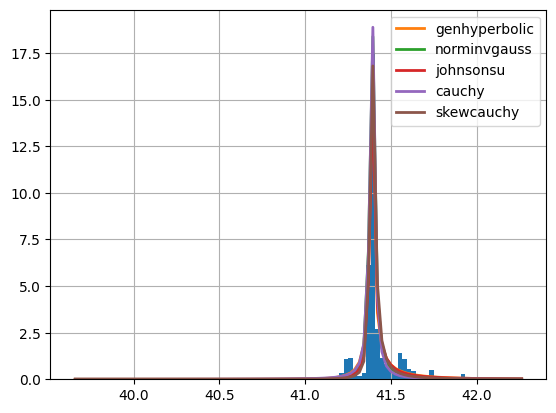

In [15]:
f = Fitter(df.latitude.dropna().values.tolist())
f.fit()
f.summary(Nbest=5)

In [16]:
lats = df.latitude.dropna().values

lat_gennorm_dist = stats.fit(stats.gennorm, lats, {"beta": [0, 20], "scale": [-5, 20], "loc": [0, 100]})
lat_norm_dist = stats.fit(stats.norm, lats, {"scale": [-5, 20], "loc": [0, 100]})

fitter_dist_name =  list(f.get_best().keys())[0]
lat_fitter_dist = getattr(stats, fitter_dist_name)

lat_gennorm_data = [stats.gennorm.rvs(scale=lat_gennorm_dist.params.scale, loc=lat_gennorm_dist.params.loc,
                                  beta=lat_gennorm_dist.params.beta) for i in range(0, len(lats))]
lat_norm_data = [stats.norm.rvs(scale=lat_norm_dist.params.scale, loc=lat_norm_dist.params.loc) for i in range(0, len(lats))]

lat_fitter_data = [lat_fitter_dist.rvs(**list(f.get_best().values())[0]) for i in range(0, len(lats))]

lat_hist_data = [lat_gennorm_data, lat_norm_data, lat_fitter_data, lats]
lat_group_labels = ["Gennorm", "Normal", fitter_dist_name.capitalize(), "Real data"]

fig = ff.create_distplot(lat_hist_data, lat_group_labels, show_hist=False, show_rug=False)
fig.show()

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\stats\_distn_infrastructure.py:2357: RuntimeWarning:

overflow encountered in divide



In [17]:
lons = df.longitude.dropna().values

lon_gennorm_dist = stats.fit(stats.gennorm, lons, {"beta": [0, 20], "scale": [-5, 20], "loc": [0, 100]})
lon_norm_dist = stats.fit(stats.norm, lons, {"scale": [-5, 20], "loc": [0, 100]})

p = list(list(f.get_best().values())[0].keys())
p_range = {k: [-5, 20] for k in p}
lon_fitter_dist = stats.fit(lat_fitter_dist, lons, p_range)

lon_gennorm_data = [stats.gennorm.rvs(scale=lon_gennorm_dist.params.scale, loc=lon_gennorm_dist.params.loc,
                                  beta=lon_gennorm_dist.params.beta) for i in range(0, len(lons))]
lon_norm_data = [stats.norm.rvs(scale=lon_norm_dist.params.scale, loc=lon_norm_dist.params.loc) for i in range(0, len(lons))]

lon_fitter_data = [lat_fitter_dist.rvs(**lon_fitter_dist.params._asdict()) for i in range(0, len(lons))]

lon_hist_data = [lon_gennorm_data, lon_norm_data, lon_fitter_data, lons]
lon_group_labels = ["Gennorm", "Normal", fitter_dist_name.capitalize(), "Real data"]

fig = ff.create_distplot(lon_hist_data, lon_group_labels, show_hist=False, show_rug=False)
fig.show()

C:\Users\jcf\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\stats\_continuous_distns.py:10348: RuntimeWarning:

overflow encountered in scalar divide



In [18]:
coords = df.loc[:, ["latitude", "longitude"]].dropna()

kde = KernelDensity(bandwidth=0.001)
kde.fit(coords)

num_synthetic_points = len(coords) 
kde_data = kde.sample(num_synthetic_points)

In [19]:
dbscan = DBSCAN(eps=0.005, min_samples=1, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))

dbscan_labels = dbscan.fit_predict(coords)
coords["dbscan_labels"] = dbscan_labels

unique_clusters = np.unique(dbscan_labels)

synthetic_latitudes = []
synthetic_longitudes = []

for cluster_id in unique_clusters:
    if cluster_id == -1:
        continue
    
    cluster_data = coords[dbscan_labels == cluster_id]
    
    kde = KernelDensity(bandwidth=0.001)
    kde.fit(cluster_data)
    
    num_synthetic_points = len(cluster_data) 
    synthetic_cluster_data = kde.sample(num_synthetic_points)
    
    synthetic_latitudes.extend(synthetic_cluster_data[:, 0])
    synthetic_longitudes.extend(synthetic_cluster_data[:, 1])

In [20]:
df_geo_synth = pd.DataFrame({"latitude": lat_fitter_data, "longitude": lon_fitter_data})

fig = go.Figure()
fig.add_traces([
    go.Scatter(x=df["latitude"], y=df["longitude"], name="Real", mode='markers', opacity=0.75),
    go.Scatter(x=synthetic_latitudes, y=synthetic_longitudes, name="Clustering + KDE", mode='markers', opacity=0.75),
    go.Scatter(x=df_geo_synth["latitude"], y=df_geo_synth["longitude"], name=fitter_dist_name.capitalize(), mode='markers', opacity=0.75),
    go.Scatter(x=kde_data[0], y=kde_data[1], name="KDE", mode='markers', opacity=0.75),
])
fig.show()

In [21]:
def calculate_wasserstein_distance(group_1_data, group_2_data):
    data1 = np.vstack(group_1_data).T
    data2 = np.vstack(group_2_data).T
    distance = stats.wasserstein_distance(data1.flatten(), data2.flatten())

    return distance

In [22]:
data_1 = [df["latitude"].dropna().values, df["longitude"].dropna().values]
data_2 = [synthetic_latitudes, synthetic_longitudes]

distance = calculate_wasserstein_distance(data_1, data_2)
print(f"Wasserstein distance between Original and Clustering+KDE: {distance}")

Wasserstein distance between Original and Clustering+KDE: 0.0005020220205683619


In [23]:
data_2 = [df_geo_synth["latitude"].values, df_geo_synth["longitude"].values]

distance = calculate_wasserstein_distance(data_1, data_2)
print(f"Wasserstein distance between Original and {fitter_dist_name}: {distance}")

Wasserstein distance between Original and genhyperbolic: 0.023891637886354535


In [24]:
data_2 = [synthetic_data["latitude"].dropna().values, synthetic_data["longitude"].dropna().values]

distance = calculate_wasserstein_distance(data_1, data_2)
print(f"Wasserstein distance between Original and CTGANSynthesizer: {distance}")

Wasserstein distance between Original and CTGANSynthesizer: 55.77171953034495


In [25]:
df_real = df[["latitude", "longitude", "price"]].dropna()
df_synth = pd.DataFrame({"latitude": synthetic_latitudes,
                         "longitude": synthetic_longitudes, 
                         "price": synthetic_data["price"].sample(len(synthetic_latitudes))})

In [26]:
fig_real = px.density_map(df_real, lat='latitude', lon='longitude', z="price",
                        radius=15)
fig_synth = px.density_map(df_synth, lat='latitude', lon='longitude', z="price",
                        radius=15)

In [27]:
fig = make_subplots(rows=1, cols=2, 
                    specs=[[{'type': 'map'}, {'type': 'map'}]], 
                    subplot_titles=("Real", "Synth"))

for trace in fig_real.data:
    trace['coloraxis'] = 'coloraxis1'
    fig.add_trace(trace, row=1, col=1)

for trace in fig_synth.data:
    trace['coloraxis'] = 'coloraxis2'
    fig.add_trace(trace, row=1, col=2)

fig.update_layout(
    height=700,
    coloraxis1=dict(colorscale='Plasma', colorbar=dict(title="Real", x=0.45)),
    coloraxis2=dict(colorscale='Plasma', colorbar=dict(title="Synth", x=1.0)),
)
fig.update_maps(style='open-street-map', zoom=8, center=dict(lat=df.latitude.mean(), 
                                    lon=df.longitude.mean()))

fig.show()

In [28]:
data_1 = [df_real["latitude"].values, df_real["longitude"].values, df_real["price"].values]
data_2 = [df_synth["latitude"].values, df_synth["longitude"].values, df_synth["price"].values]

distance = calculate_wasserstein_distance(data_1, data_2)
print(f"Wasserstein distance between Original latlon+price and synthetized: {distance}")

Wasserstein distance between Original latlon+price and synthetized: 39.47074330864518


In [29]:
# import boto3
# import googlemaps

# pd.set_option("display.precision", 16)

# ssm = boto3.client("ssm", region_name="eu-west-1")
# maps_key = ssm.get_parameter(Name="GOOGLE_MAPS_GEOCODING_API_KEY", WithDecryption=True)
# maps_key = maps_key["Parameter"]["Value"]

# gmaps = googlemaps.Client(key=maps_key)

# df_test_geo = df_synth.sample(2)

# def get_best_city(address):
#     for e in address:
#         if e['geometry']['location_type'] == "ROOFTOP":
#             cities = [component["long_name"] for component in e["address_components"] if "locality" in component["types"]]
#             if cities:
#                 return cities[0]
#         else:
#             cities = [component["long_name"] for component in e["address_components"] if "locality" in component["types"]]
#             if cities:
#                 return cities[0]
#             else:
#                 return None

# df_test_geo["city"] = df_test_geo.apply(lambda x: get_best_city(gmaps.reverse_geocode((x["latitude"], x["longitude"]))), axis=1)

# df_test_geo

In [37]:
import pickle
from sklearn.metrics import root_mean_squared_error
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split


In [31]:
# https://analisi.transparenciacatalunya.cat/Urbanisme-infraestructures/L-mits-administratius-municipals-de-Catalunya/97qg-zvqd

In [32]:
df_gg = gpd.read_file("Límits administratius municipals de Catalunya.geojson")
df_gg = df_gg[["nom_muni", "geometry"]]
df_gg = df_gg.rename(columns={"nom_muni": "city"})

In [33]:
num_rows = original_data.shape[0]

df_synth_model = synthesizer.sample(num_rows=num_rows)  
max_len = min(num_rows, len(synthetic_latitudes))
df_synth_model = df_synth_model.iloc[0:max_len]
df_synth_model["latitude"] = synthetic_latitudes[0:max_len]
df_synth_model["longitude"] = synthetic_longitudes[0:max_len]
df_synth_model = df_synth_model[df_synth_model.columns.difference(["city"])]

df_synth_model = gpd.GeoDataFrame(df_synth_model, 
                                  geometry=gpd.points_from_xy(df_synth_model.longitude, 
                                                              df_synth_model.latitude), 
                                  crs="EPSG:4326")
df_synth_model = df_synth_model.sjoin(df_gg, how="inner")

df_synth_model["pets"] = df_synth_model["pets"].astype(str).str.lower()
df_synth_model["pets"] = df_synth_model["pets"].str.replace("null", "Null")
df_synth_model = df_synth_model.dropna(subset=["surface"])
df_synth_model["state"] = np.random.choice(probs["state"]["state"].values, 
                                           (df_synth_model.shape[0]), p=probs["state"]["prob_state"].values/100)

df_synth_model_raw = df_synth_model.copy()

In [34]:
cat_cols_model = ["city", "type", "orientation", "age", "parking", "floor", 
            "elevator", "furniture", "state", "heating", "water_heating", 
             "pets", "loudness"]
for c in cat_cols_model:
    if c in df_synth_model.columns:
        df_synth_model.loc[df_synth_model[c].isnull(), c] = "Null"
        df_synth_model[c] = df_synth_model[c].astype(str)
        df_synth_model[f"is_null_{c}"] = df_synth_model[c].eq("Null")
        # df_synth_model[c] = pd.Categorical(df_synth_model[c])

In [35]:
transform_columns = ["surface"]
bool_cols = [f"is_null_{c}" for c in cat_cols_model]


def convert_bool_to_int(X):
    X = X.copy()
    X[bool_cols] = X[bool_cols].astype(int)
    return X


def change_infrequent_categories(X):
    X = X.copy()
    for c in cat_cols_model:
        if c in X.columns:
            _df = X[[c]].copy()
            _df["count"] = 1
            _df = _df.groupby(c).count().reset_index()[[c, "count"]]  
            _df["count"] = 100 * _df["count"] / _df["count"].sum()
            infrequent_cats = _df.loc[_df["count"] < 1, c].unique()
            X[c] = X[c].replace(infrequent_cats, "Other")
    
    return X


class OutputTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, model, output_transform=None, target_transform=None):
        self.model = model
        self.output_transform = output_transform
        self.target_transform = target_transform

    def fit(self, X, y=None):
        if self.target_transform is not None:
            y = self.target_transform(y)
        self.model.fit(X, y)
        return self

    def predict(self, X):
        predictions = self.model.predict(X)        
        if self.output_transform:
            predictions = self.output_transform(predictions)
        
        return predictions

    def score(self, X, y):
        if self.target_transform is not None:
            y = self.target_transform(y)
        return self.model.score(X, y)
        
    def transform(self, X, y=None):
        return X


class ColumnSelector(BaseEstimator, TransformerMixin):       
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        remove_cols = ["price", "energy", "emissions", "latitude", "longitude", "rooms", "bathrooms"]
        return X[X.columns.difference(remove_cols)]

In [38]:
X_train, X_test, y_train, y_test = train_test_split(df_synth_model, df_synth_model['price'], test_size=0.2)

with open('tuned_pipeline.pkl', 'rb') as f:
    pipe_full = pickle.load(f)

pipe_full.fit_transform(X_train, y_train)

df_synth_model["price_model"] = pipe_full.predict(df_synth_model)
df_synth_model["error"] = df_synth_model["price"] - df_synth_model["price_model"]

In [39]:
print(f"score train: {pipe_full.score(X_train, y_train)}")
print(f"score test: {pipe_full.score(X_test, y_test)}")
print(f"error in train: {root_mean_squared_error(y_train, pipe_full.predict(X_train))}")
print(f"error in test: {root_mean_squared_error(y_test, pipe_full.predict(X_test))}")

score train: 0.4820532924914549
score test: 0.2825293499155943
error in train: 1216.189321889527
error in test: 1515.2889293814244


In [40]:
data_1 = [df_synth_model["latitude"].values, df_synth_model["longitude"].values, df_synth_model["price"].values]
data_2 = [df_synth_model["latitude"].values, df_synth_model["longitude"].values, df_synth_model["price_model"].values]

distance = calculate_wasserstein_distance(data_1, data_2)
print(f"Wasserstein distance between Synth latlon+price and model: {distance}")

Wasserstein distance between Synth latlon+price and model: 184.48410815028706


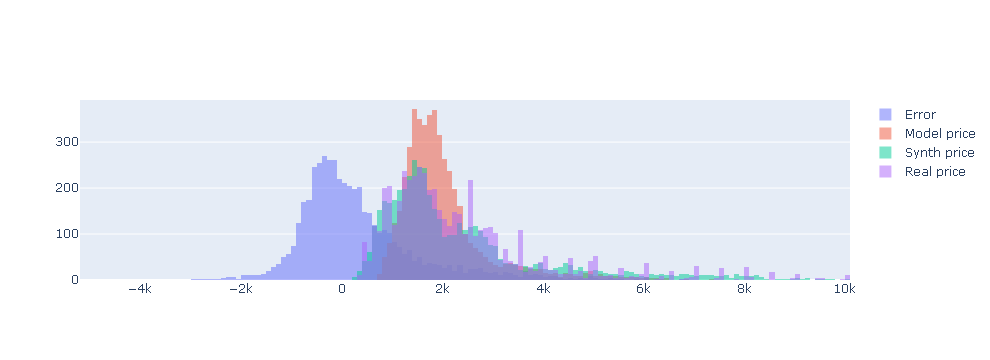

In [41]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=df_synth_model["error"].sort_values(), name=f"Error", xbins={"size": 100}))
fig.add_trace(go.Histogram(x=df_synth_model["price_model"].sort_values(), name=f"Model price", xbins={"size": 100}))
fig.add_trace(go.Histogram(x=df_synth_model["price"].sort_values(), name=f"Synth price", xbins={"size": 100}))
fig.add_trace(go.Histogram(x=original_data["price"].sort_values(), name=f"Real price", xbins={"size": 100}))

fig.update_layout(
    barmode="overlay"
)
fig.update_traces(opacity=0.5)
fig.show()

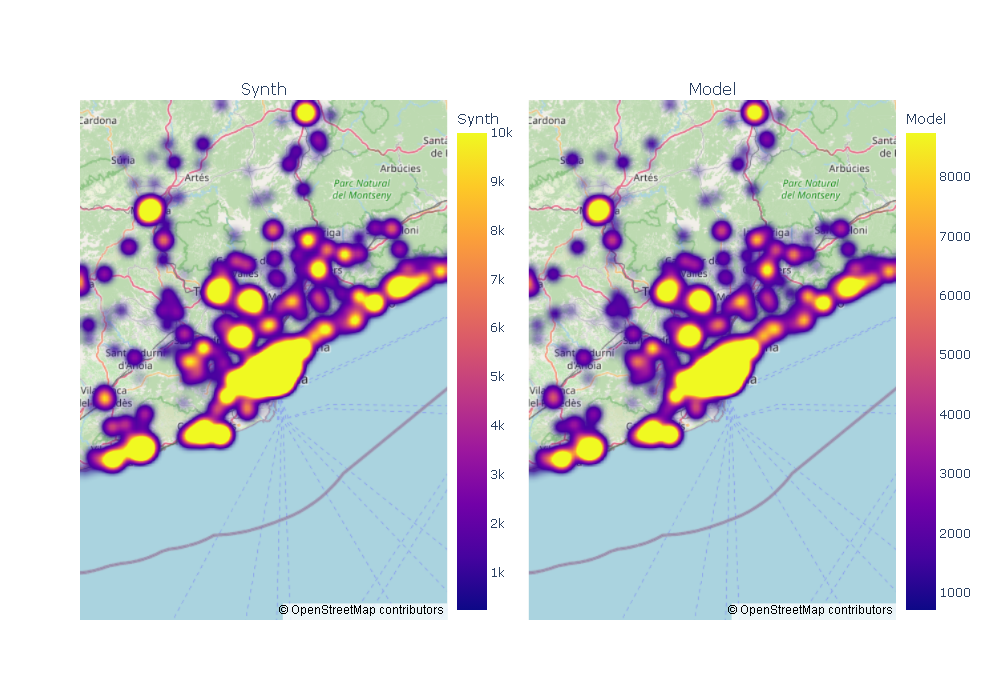

In [42]:
fig_synth = px.density_map(df_synth_model, lat='latitude', lon='longitude', z="price",
                        radius=15)
fig_model = px.density_map(df_synth_model, lat='latitude', lon='longitude', z="price_model",
                        radius=15)
fig = make_subplots(rows=1, cols=2, 
                    specs=[[{'type': 'map'}, {'type': 'map'}]], 
                    subplot_titles=("Synth", "Model"))

for trace in fig_synth.data:
    trace['coloraxis'] = 'coloraxis1'
    fig.add_trace(trace, row=1, col=1)

for trace in fig_model.data:
    trace['coloraxis'] = 'coloraxis2'
    fig.add_trace(trace, row=1, col=2)

fig.update_layout(
    height=700,
    coloraxis1=dict(colorscale='Plasma', colorbar=dict(title="Synth", x=0.45)),
    coloraxis2=dict(colorscale='Plasma', colorbar=dict(title="Model", x=1.0)),
)
fig.update_maps(style='open-street-map', zoom=8, center=dict(lat=df.latitude.mean(), 
                                    lon=df.longitude.mean()))

fig.show()